
=== Изображение 1, класс: Гароу ===

Отдельные аугментации:


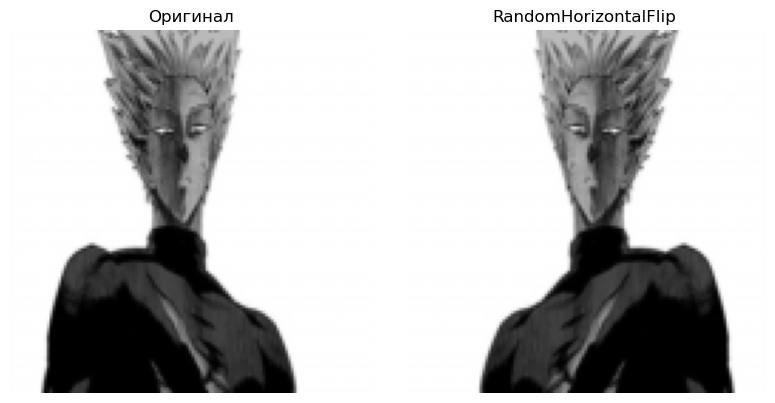

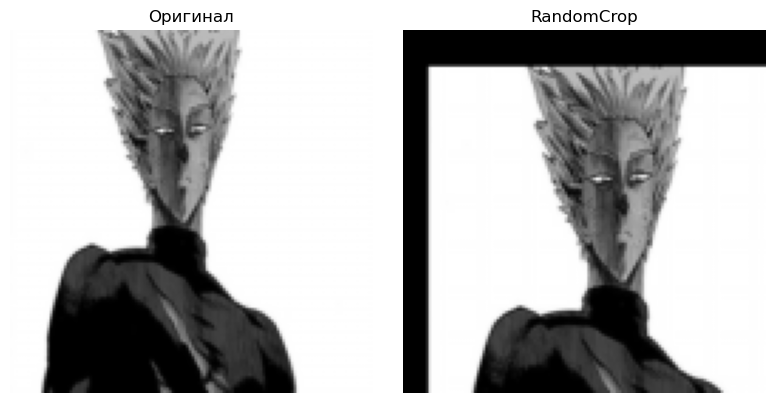

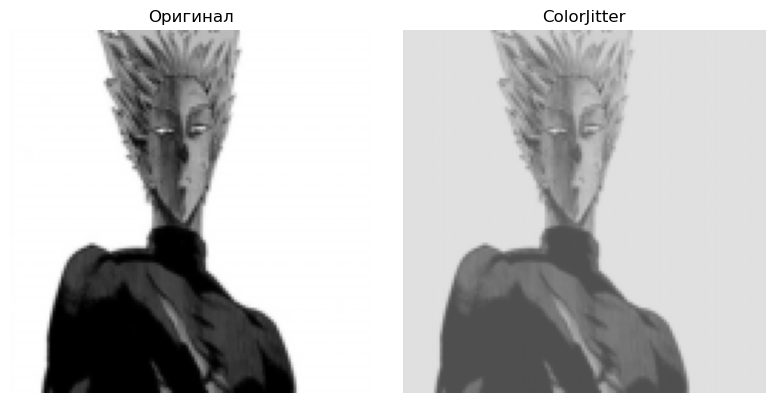

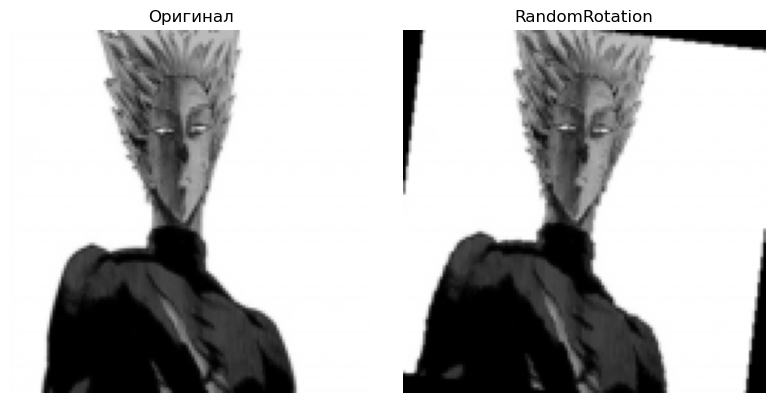

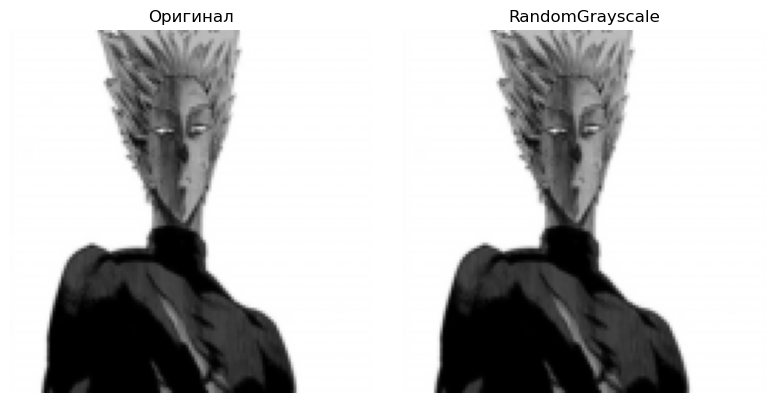


Комбинированные аугментации:


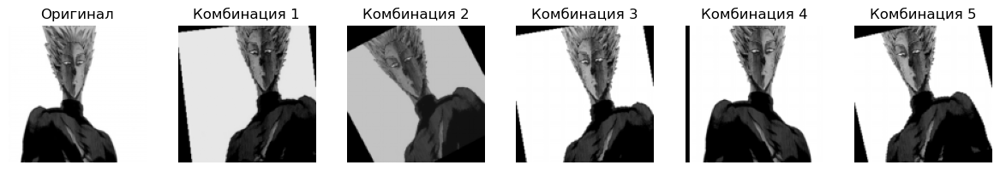


=== Изображение 2, класс: Генос ===

Отдельные аугментации:


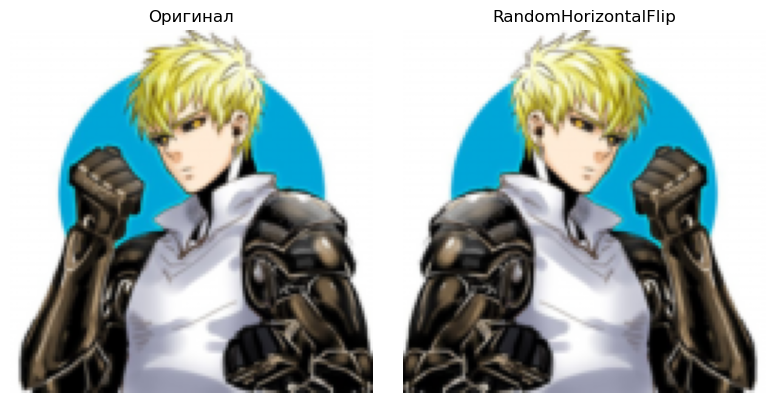

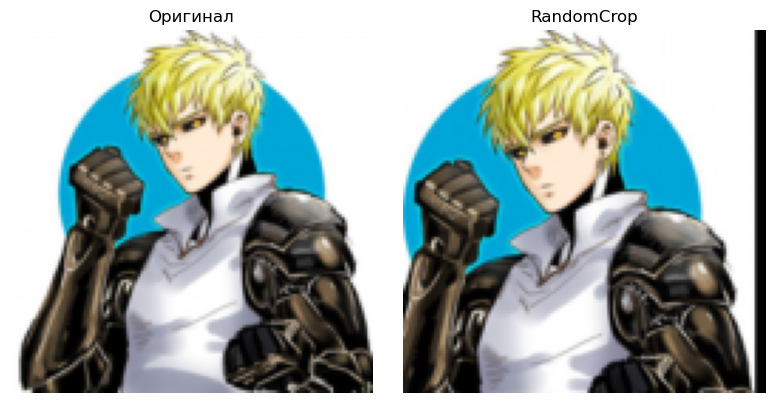

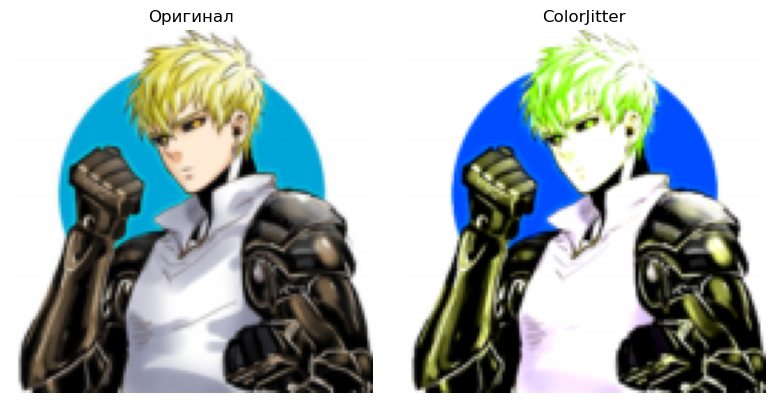

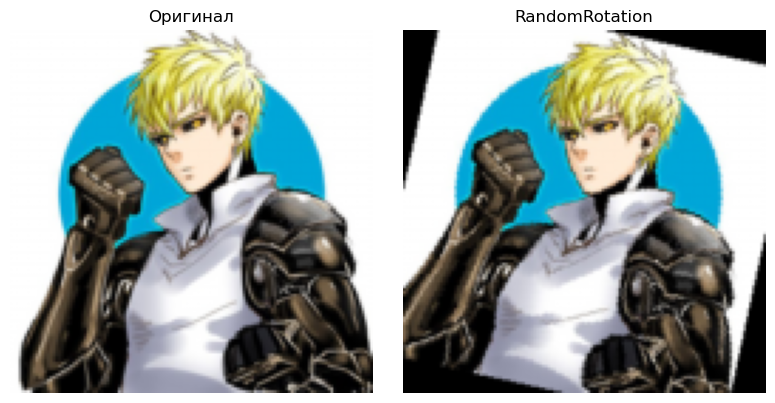

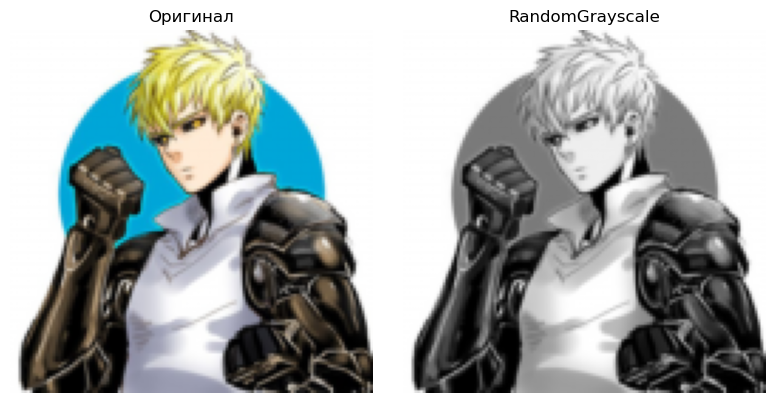


Комбинированные аугментации:


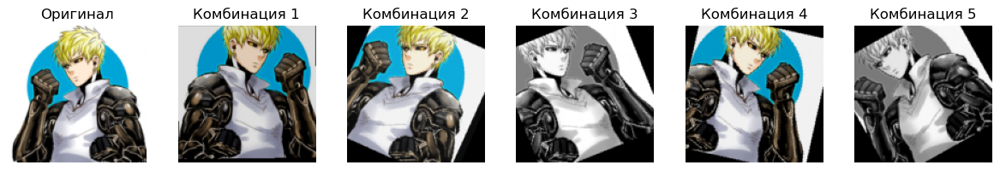


=== Изображение 3, класс: Сайтама ===

Отдельные аугментации:


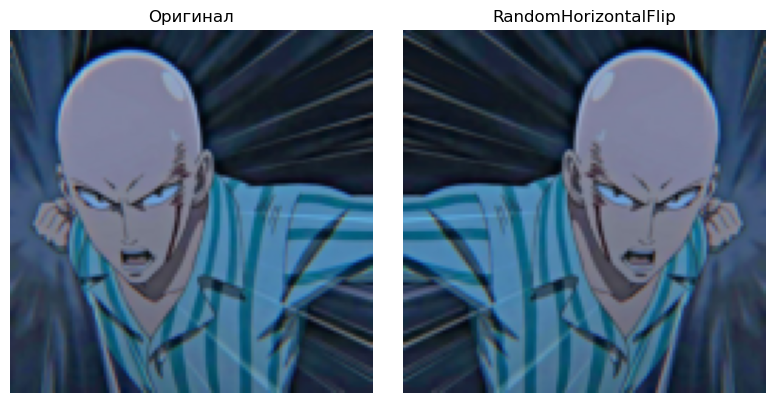

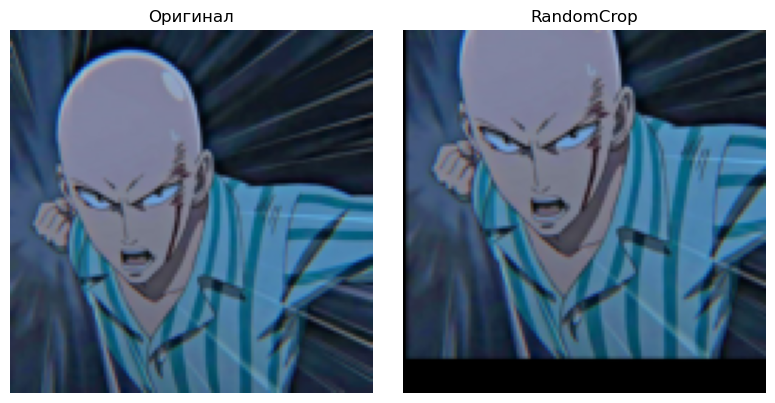

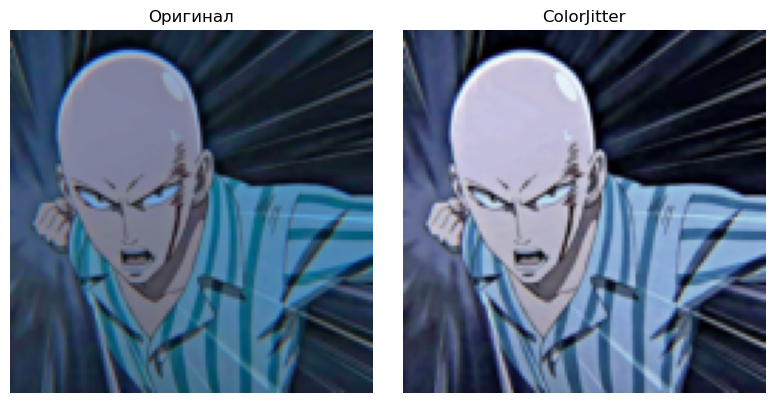

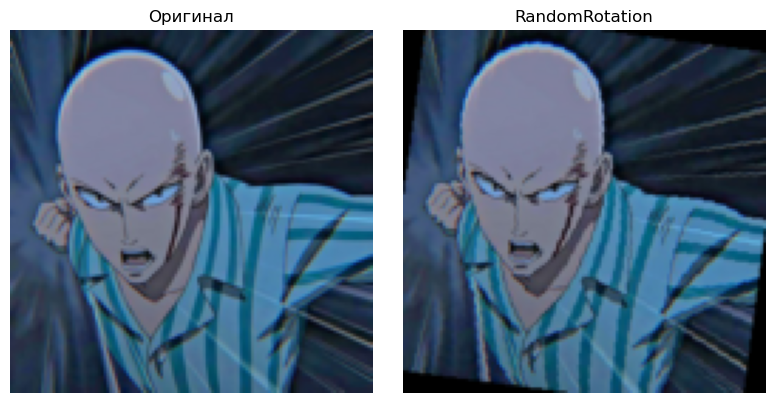

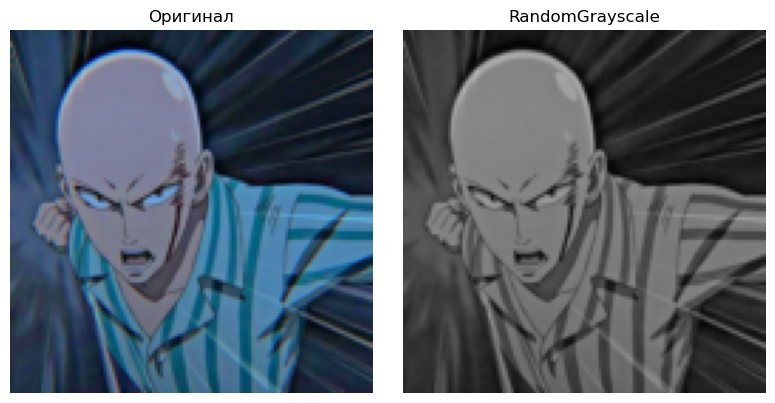


Комбинированные аугментации:


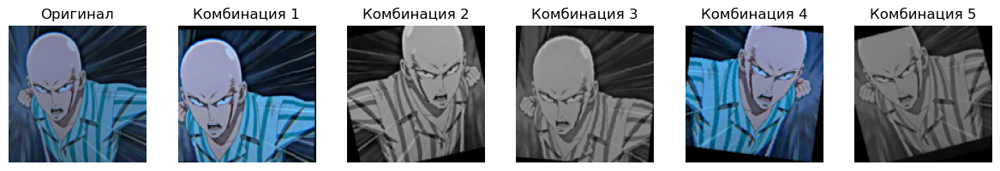


=== Изображение 4, класс: Соник ===

Отдельные аугментации:


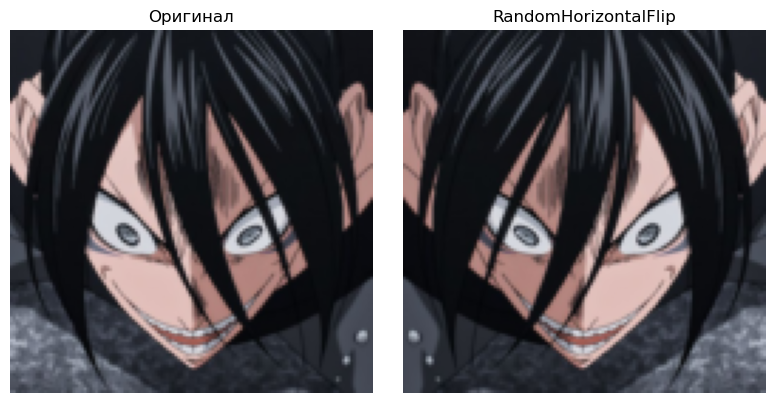

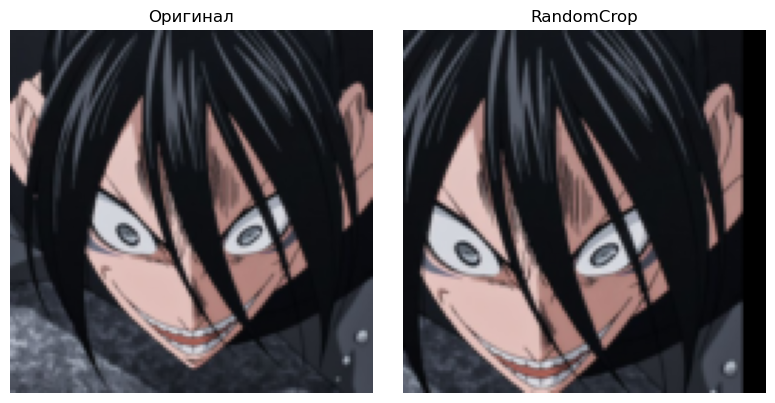

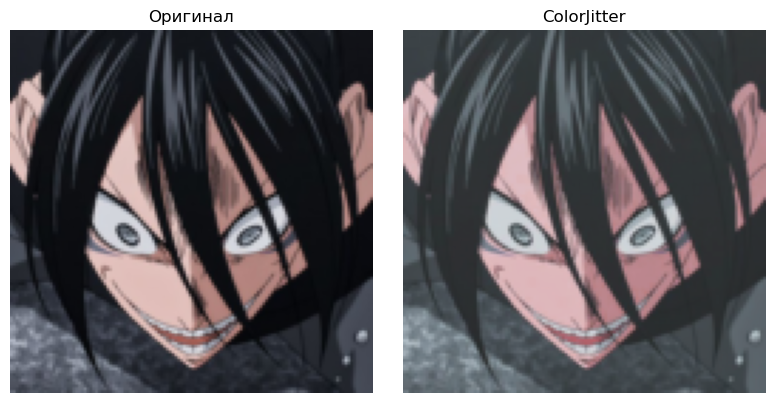

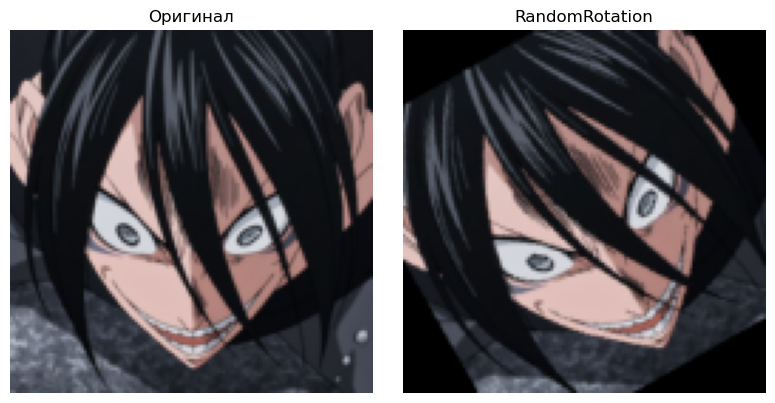

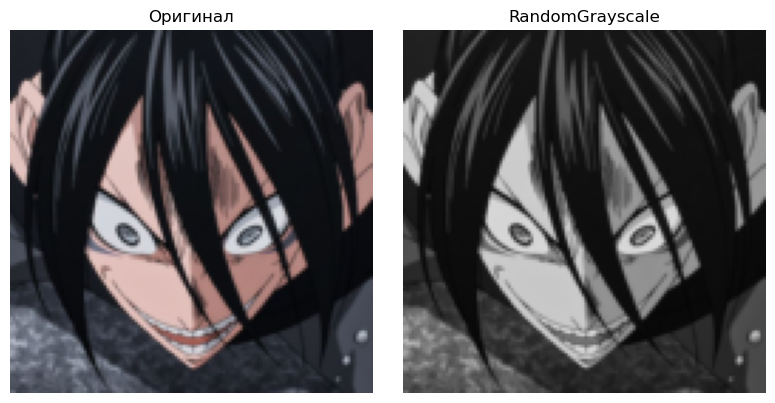


Комбинированные аугментации:


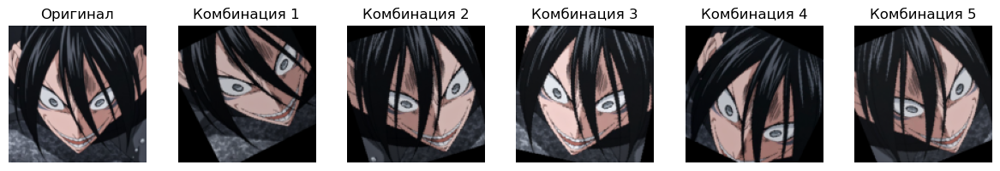


=== Изображение 5, класс: Татсумаки ===

Отдельные аугментации:


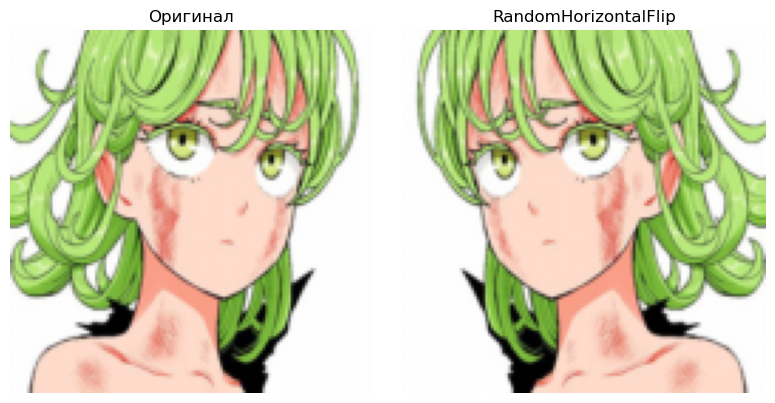

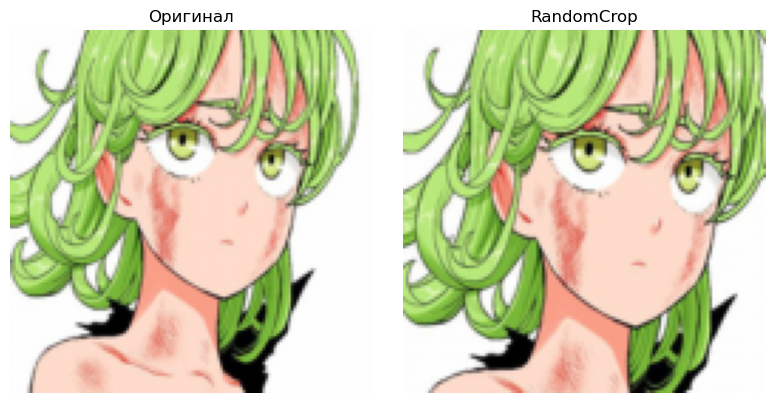

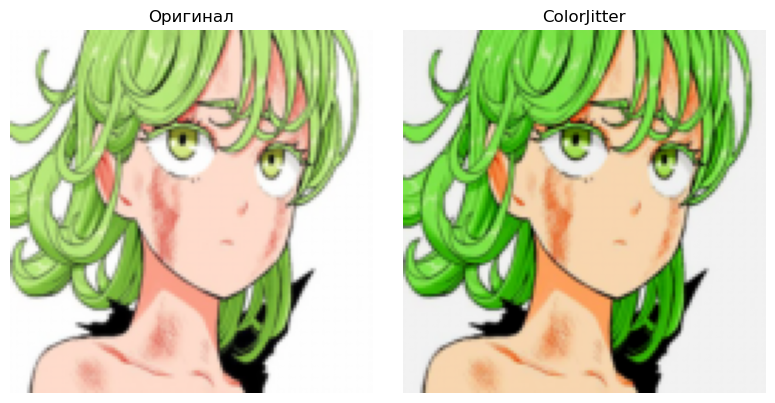

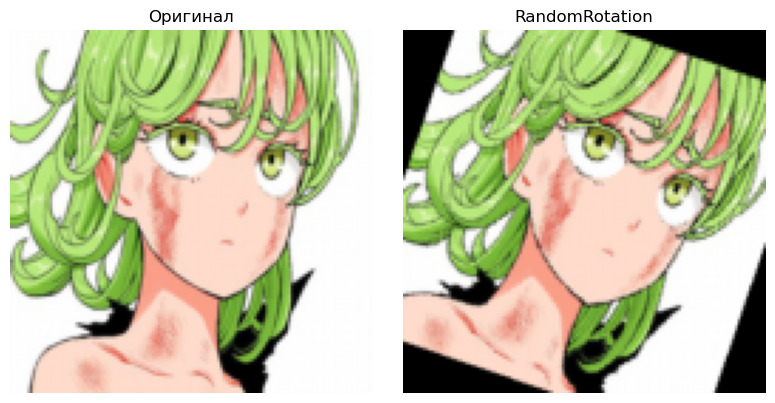

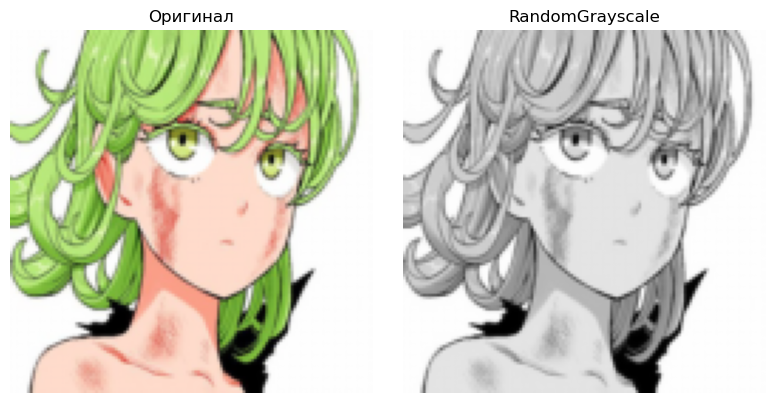


Комбинированные аугментации:


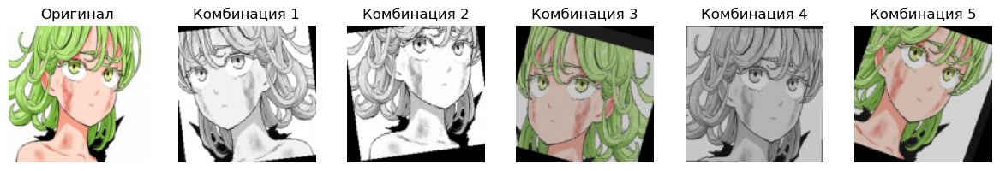

In [3]:
import torch
from torchvision import transforms
from PIL import Image
from datasets import CustomImageDataset
from utils import show_single_augmentation, show_multiple_augmentations
import matplotlib.pyplot as plt

# Параметры
root = './data/train'  # Путь к папке train
target_size = (224, 224)  # Размер изображений
num_images = 5  # Количество изображений для демонстрации

# Загрузка датасета без аугментаций
dataset = CustomImageDataset(root, transform=None, target_size=target_size)
class_names = dataset.get_class_names()

# Выбираем по одному изображению из разных классов
selected_images = []
selected_labels = []
class_indices = {}  # Для отслеживания выбранных классов

# Собираем по одному изображению из разных классов
for idx in range(len(dataset)):
    img, label = dataset[idx]
    if label not in class_indices and len(class_indices) < num_images:
        class_indices[label] = idx
        selected_images.append(img)
        selected_labels.append(label)
    if len(class_indices) == num_images:
        break

# Список стандартных аугментаций torchvision
standard_augs = [
    ("RandomHorizontalFlip", transforms.RandomHorizontalFlip(p=1.0)),
    ("RandomCrop", transforms.RandomCrop(200, padding=20)),
    ("ColorJitter", transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)),
    ("RandomRotation", transforms.RandomRotation(degrees=30)),
    ("RandomGrayscale", transforms.RandomGrayscale(p=1.0))
]

# Преобразование PIL Image в тензор
to_tensor = transforms.ToTensor()

# Обработка каждого изображения
for img_idx, (original_img, label) in enumerate(zip(selected_images, selected_labels)):
    print(f"\n=== Изображение {img_idx + 1}, класс: {class_names[label]} ===")

    # Преобразуем original_img в тензор
    original_tensor = to_tensor(original_img)

    # Демонстрация каждой аугментации отдельно
    print("\nОтдельные аугментации:")
    for aug_name, aug in standard_augs:
        aug_transform = transforms.Compose([
            aug,
            transforms.ToTensor()
        ])
        aug_img = aug_transform(original_img)
        show_single_augmentation(original_tensor, aug_img, aug_name)

    # Демонстрация комбинированных аугментаций
    print("\nКомбинированные аугментации:")
    combined_aug = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomCrop(200, padding=20),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
        transforms.RandomRotation(degrees=30),
        transforms.RandomGrayscale(p=0.3),
        transforms.ToTensor()
    ])

    # Применяем комбинированные аугментации несколько раз для разнообразия
    combined_imgs = []
    titles = [f"Комбинация {i+1}" for i in range(5)]
    for _ in range(5):
        combined_img = combined_aug(original_img)
        combined_imgs.append(combined_img)

    show_multiple_augmentations(original_tensor, combined_imgs, titles)

# Показываем все графики
plt.show()

In [2]:
# Кастомные аугментации
import torch
import random
import numpy as np
from PIL import Image, ImageEnhance, ImageFilter
import torchvision.transforms.functional as F

class RandomGaussianBlur:
    """Применяет случайное гауссово размытие к изображению."""
    def __init__(self, p=0.5, max_radius=3):
        self.p = p
        self.max_radius = max_radius

    def __call__(self, img):
        if random.random() > self.p:
            return img
        radius = random.uniform(0, self.max_radius)
        return img.filter(ImageFilter.GaussianBlur(radius=radius))

class RandomPerspective:
    """Применяет случайное перспективное искажение."""
    def __init__(self, p=0.5, distortion_scale=0.3):
        self.p = p
        self.distortion_scale = distortion_scale

    def __call__(self, img):
        if random.random() > self.p:
            return img
        img_tensor = F.to_tensor(img)
        img_pil = F.perspective(
            img,
            startpoints=[[0, 0], [img.width, 0], [img.width, img.height], [0, img.height]],
            endpoints=[
                [random.uniform(0, img.width * self.distortion_scale), random.uniform(0, img.height * self.distortion_scale)],
                [img.width - random.uniform(0, img.width * self.distortion_scale), random.uniform(0, img.height * self.distortion_scale)],
                [img.width - random.uniform(0, img.width * self.distortion_scale), img.height - random.uniform(0, img.height * self.distortion_scale)],
                [random.uniform(0, img.width * self.distortion_scale), img.height - random.uniform(0, img.height * self.distortion_scale)]
            ]
        )
        return img_pil

class RandomBrightnessContrast:
    """Случайно изменяет яркость и контрастность изображения."""
    def __init__(self, p=0.5, brightness_factor=(0.7, 1.3), contrast_factor=(0.7, 1.3)):
        self.p = p
        self.brightness_factor = brightness_factor
        self.contrast_factor = contrast_factor

    def __call__(self, img):
        if random.random() > self.p:
            return img
        brightness = random.uniform(*self.brightness_factor)
        contrast = random.uniform(*self.contrast_factor)
        img = ImageEnhance.Brightness(img).enhance(brightness)
        img = ImageEnhance.Contrast(img).enhance(contrast)
        return img


=== Изображение 1, класс: Гароу ===

Кастомные аугментации:


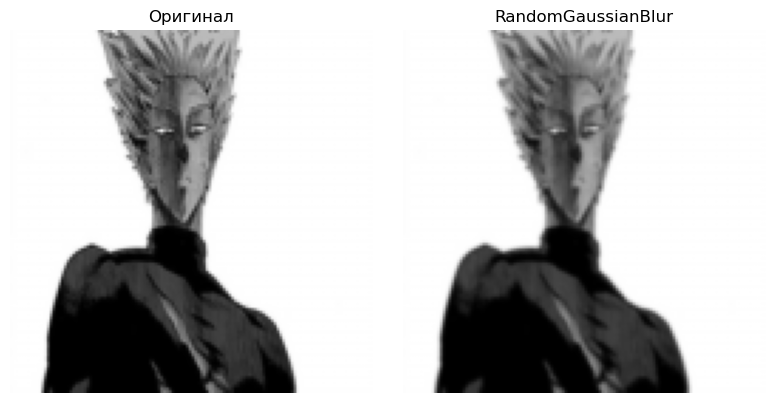

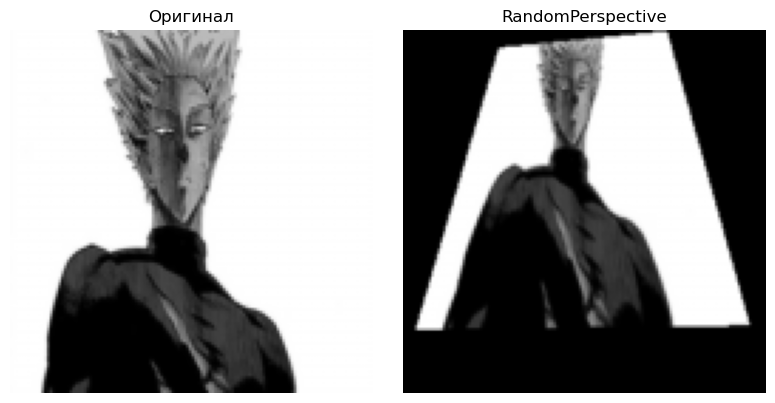

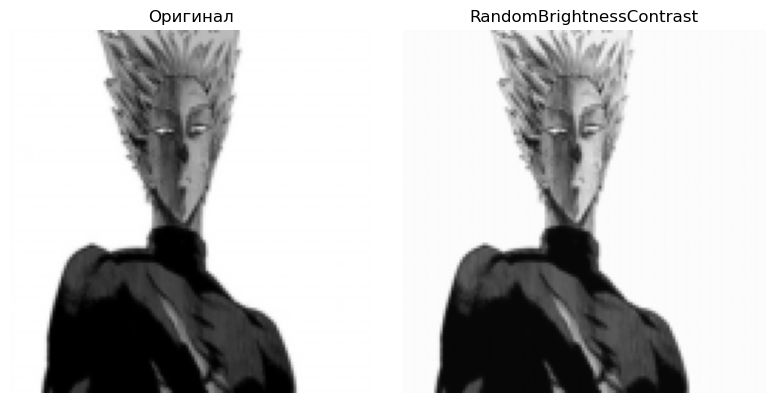


Существующие аугментации (из extra_augs.py):


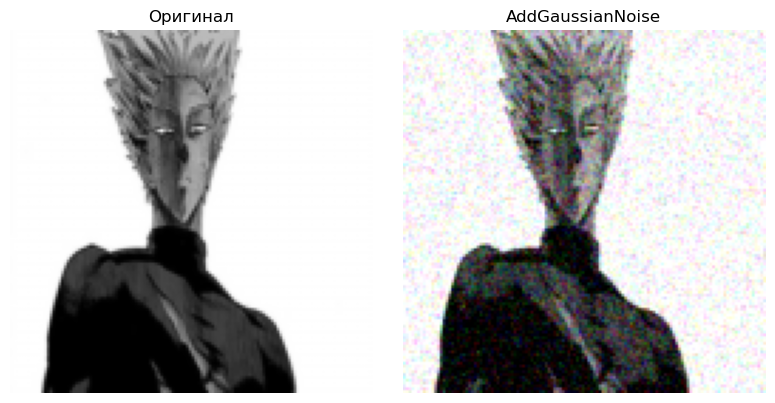

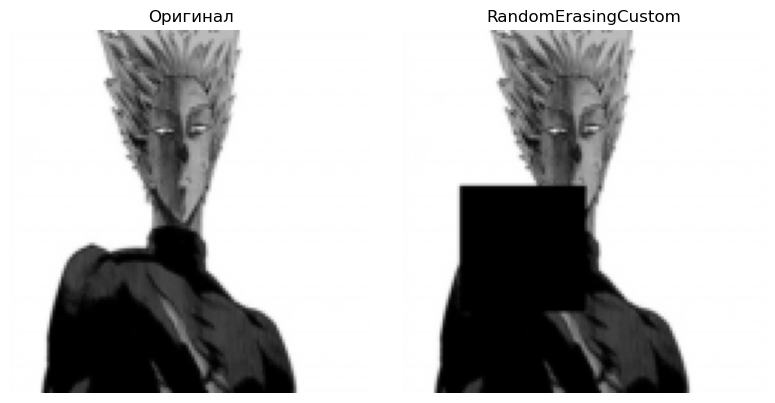

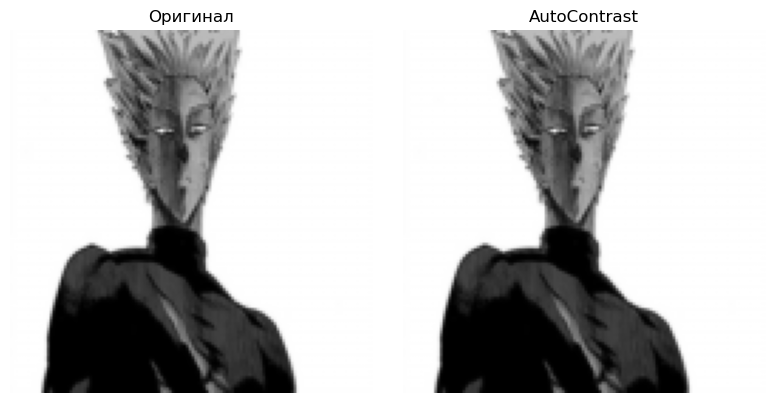


=== Изображение 2, класс: Генос ===

Кастомные аугментации:


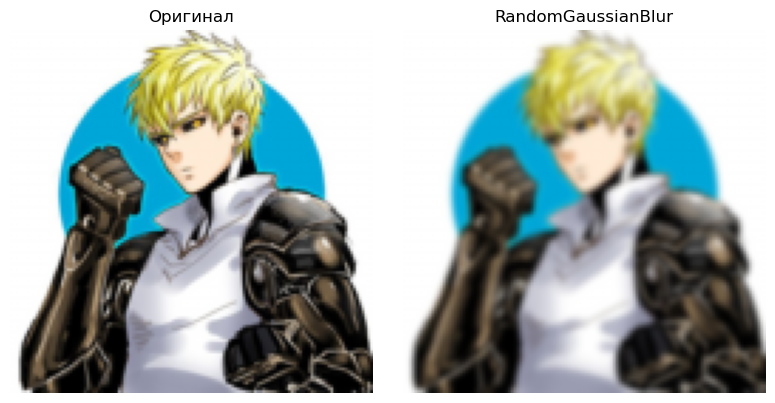

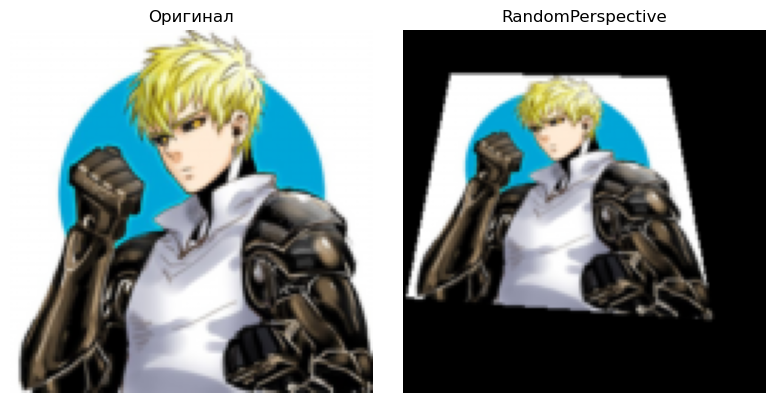

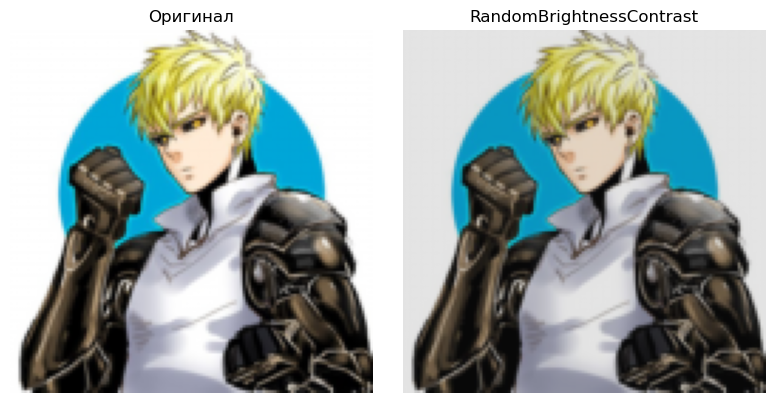


Существующие аугментации (из extra_augs.py):


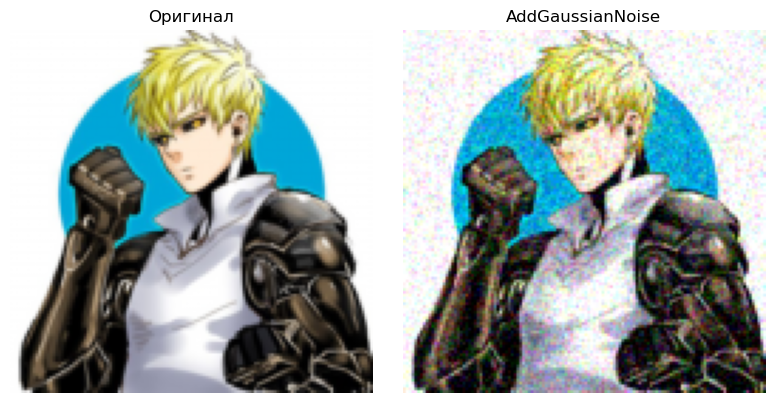

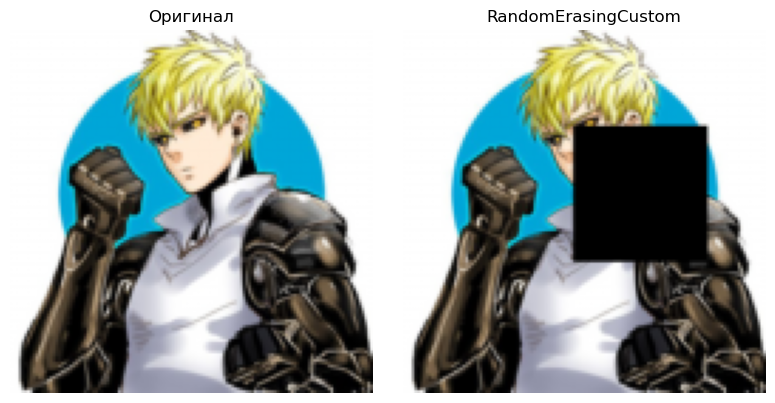

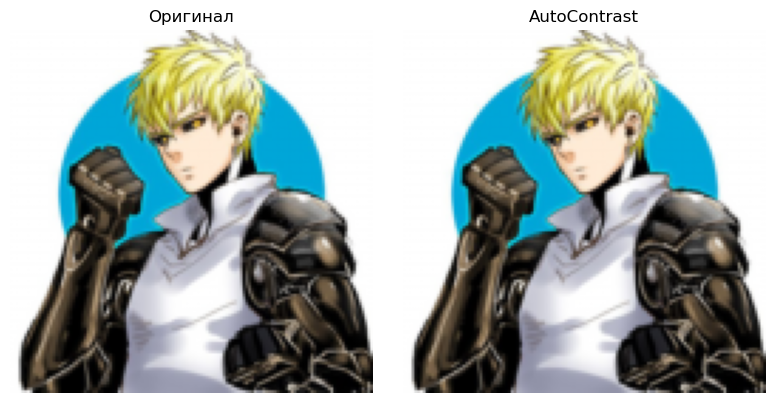


=== Изображение 3, класс: Сайтама ===

Кастомные аугментации:


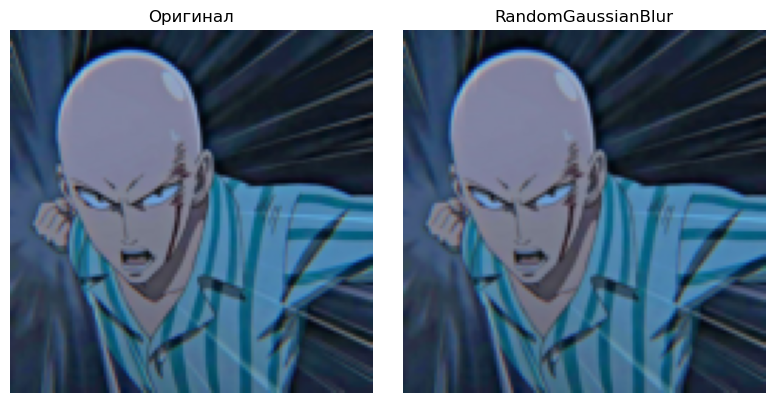

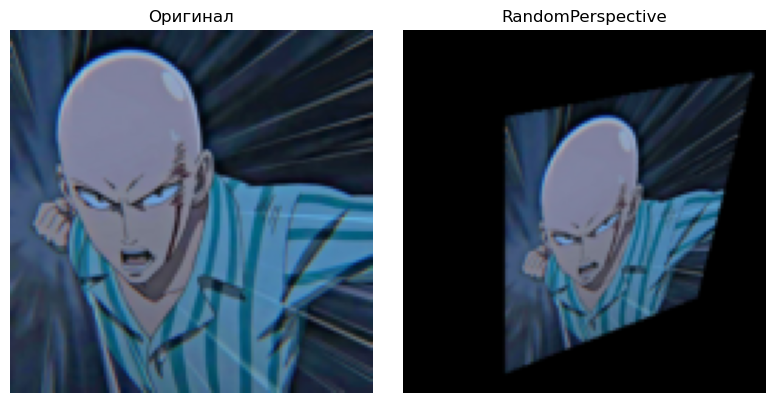

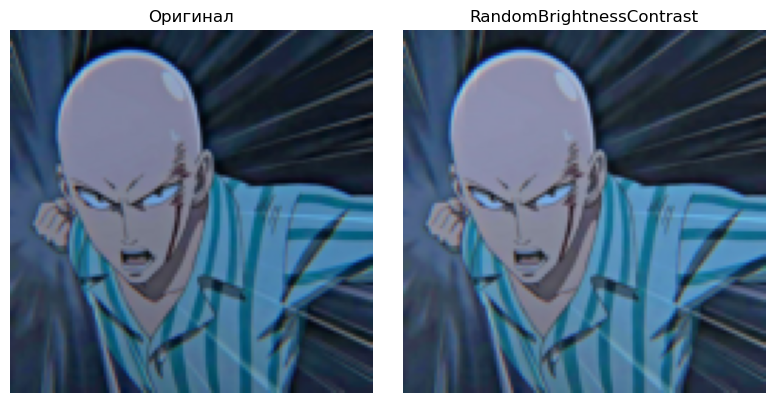


Существующие аугментации (из extra_augs.py):


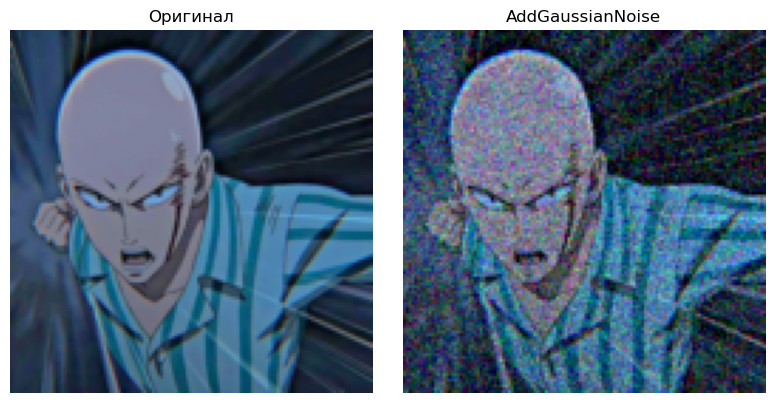

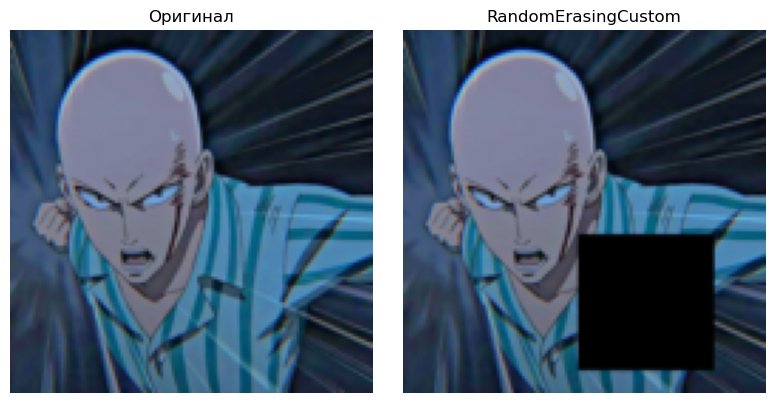

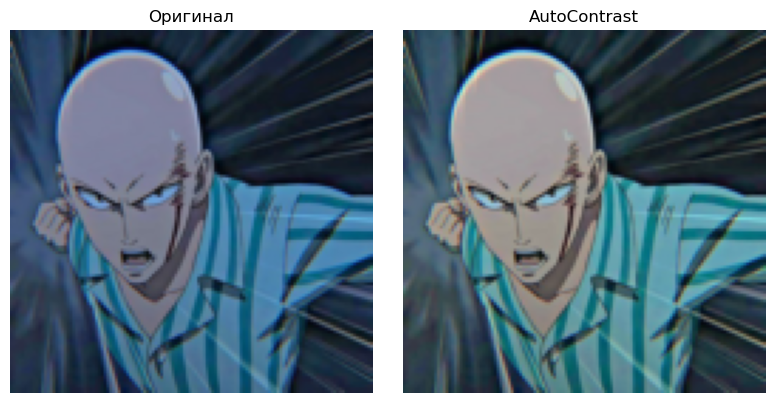

In [4]:
import torch
from torchvision import transforms
from PIL import Image
from datasets import CustomImageDataset
from utils import show_single_augmentation, show_multiple_augmentations
from extra_augs import AddGaussianNoise, RandomErasingCustom, AutoContrast
import matplotlib.pyplot as plt



# Параметры
root = './data/train'  # Путь к папке train
target_size = (224, 224)  # Размер изображений
num_images = 3  # Количество изображений для демонстрации

# Загрузка датасета без аугментаций
dataset = CustomImageDataset(root, transform=None, target_size=target_size)
class_names = dataset.get_class_names()

# Выбираем изображения из разных классов
selected_images = []
selected_labels = []
class_indices = {}

for idx in range(len(dataset)):
    img, label = dataset[idx]
    if label not in class_indices and len(class_indices) < num_images:
        class_indices[label] = idx
        selected_images.append(img)
        selected_labels.append(label)
    if len(class_indices) == num_images:
        break

# Список кастомных аугментаций
custom_augs = [
    ("RandomGaussianBlur", RandomGaussianBlur(p=1.0, max_radius=3)),
    ("RandomPerspective", RandomPerspective(p=1.0, distortion_scale=0.3)),
    ("RandomBrightnessContrast", RandomBrightnessContrast(p=1.0, brightness_factor=(0.7, 1.3), contrast_factor=(0.7, 1.3)))
]

# Список аугментаций из extra_augs.py для сравнения
existing_augs = [
    ("AddGaussianNoise", AddGaussianNoise(mean=0., std=0.2)),
    ("RandomErasingCustom", RandomErasingCustom(p=1.0, scale=(0.02, 0.2))),
    ("AutoContrast", AutoContrast(p=1.0))
]

# Преобразование в тензор для существующих аугментаций
to_tensor = transforms.ToTensor()

# Обработка каждого изображения
for img_idx, (original_img, label) in enumerate(zip(selected_images, selected_labels)):
    print(f"\n=== Изображение {img_idx + 1}, класс: {class_names[label]} ===")

    # Преобразуем оригинальное изображение в тензор для существующих аугментаций
    original_tensor = to_tensor(original_img)

    # Демонстрация кастомных аугментаций
    print("\nКастомные аугментации:")
    for aug_name, aug in custom_augs:
        aug_img = aug(original_img)
        aug_tensor = to_tensor(aug_img)  # Преобразуем в тензор для визуализации
        show_single_augmentation(original_tensor, aug_tensor, aug_name)

    # Демонстрация существующих аугментаций из extra_augs.py
    print("\nСуществующие аугментации (из extra_augs.py):")
    for aug_name, aug in existing_augs:
        aug_transform = transforms.Compose([to_tensor, aug])
        aug_img = aug_transform(original_img)
        show_single_augmentation(original_tensor, aug_img, aug_name)

# Показываем все графики
plt.show()


=== Количество изображений в каждом классе ===
Класс Гароу: 30 изображений
Класс Генос: 30 изображений
Класс Сайтама: 30 изображений
Класс Соник: 30 изображений
Класс Татсумаки: 30 изображений
Класс Фубуки: 30 изображений

=== Размеры изображений ===
Минимальный размер: 210x240
Максимальный размер: 736x1308
Средний размер: 538.89x623.56


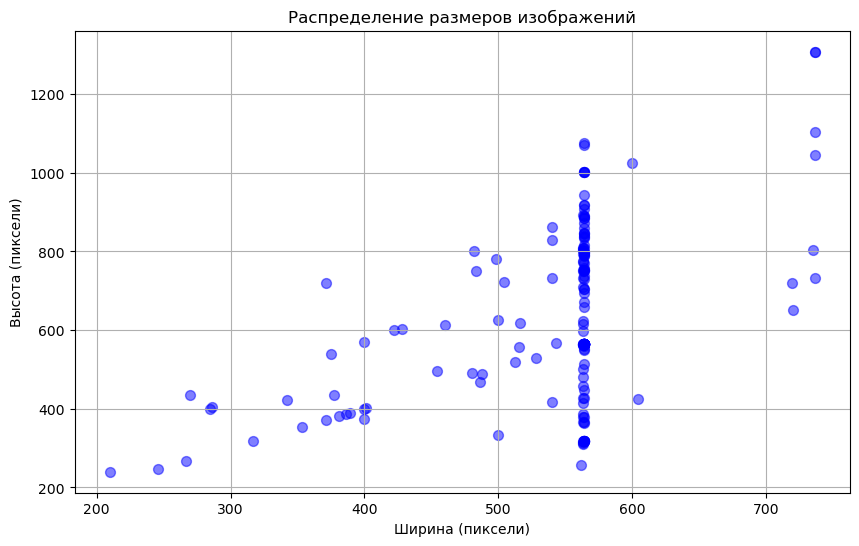

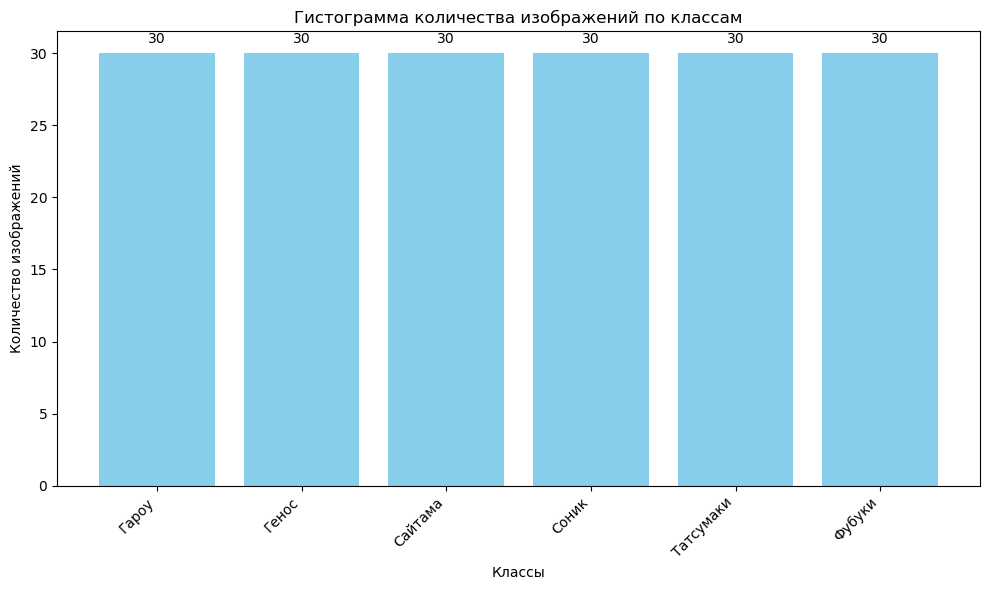

In [6]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from datasets import CustomImageDataset

# Параметры
root = './data/train'  # Путь к папке train

# Загрузка датасета без аугментаций
dataset = CustomImageDataset(root, transform=None, target_size=None)  # target_size=None, чтобы получить оригинальные размеры
class_names = dataset.get_class_names()

# 1. Подсчет количества изображений в каждом классе
class_counts = {}
for class_name in class_names:
    class_dir = os.path.join(root, class_name)
    img_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]
    class_counts[class_name] = len(img_files)

print("\n=== Количество изображений в каждом классе ===")
for class_name, count in class_counts.items():
    print(f"Класс {class_name}: {count} изображений")

# 2. Определение размеров изображений
widths = []
heights = []
for img_path in dataset.images:
    with Image.open(img_path) as img:
        width, height = img.size
        widths.append(width)
        heights.append(height)

# Подсчет минимального, максимального и среднего размеров
min_width, max_width = min(widths), max(widths)
min_height, max_height = min(heights), max(heights)
mean_width, mean_height = np.mean(widths), np.mean(heights)

print("\n=== Размеры изображений ===")
print(f"Минимальный размер: {min_width}x{min_height}")
print(f"Максимальный размер: {max_width}x{max_height}")
print(f"Средний размер: {mean_width:.2f}x{mean_height:.2f}")

# 3. Визуализация распределения размеров (scatter plot)
plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.5, c='blue', s=50)
plt.title("Распределение размеров изображений")
plt.xlabel("Ширина (пиксели)")
plt.ylabel("Высота (пиксели)")
plt.grid(True)
plt.show()

# 4. Визуализация гистограммы по классам
plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.title("Гистограмма количества изображений по классам")
plt.xlabel("Классы")
plt.ylabel("Количество изображений")
plt.xticks(rotation=45, ha='right')

# Добавляем значения на вершинах столбцов
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, int(yval), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [20]:
from PIL import Image
import torch
from torchvision import transforms

class AugmentationPipeline:
    """Класс для управления пайплайном аугментаций изображений."""
    def __init__(self):
        self.augmentations = {}  # Словарь: {name: (aug, input_type)}
        self.to_tensor = transforms.ToTensor()
        self.to_pil = transforms.ToPILImage()

    def add_augmentation(self, name, aug, input_type='PIL'):
        """Добавляет аугментацию в пайплайн.
        
        Args:
            name (str): Имя аугментации.
            aug (callable): Функция или объект аугментации.
            input_type (str): Тип входных данных ('PIL' или 'tensor').
        """
        if not isinstance(name, str):
            raise ValueError("Имя аугментации должно быть строкой")
        if input_type not in ['PIL', 'tensor']:
            raise ValueError("input_type должен быть 'PIL' или 'tensor'")
        self.augmentations[name] = (aug, input_type)

    def remove_augmentation(self, name):
        """Удаляет аугментацию из пайплайна по имени.
        
        Args:
            name (str): Имя аугментации для удаления.
        """
        if name in self.augmentations:
            del self.augmentations[name]
        else:
            raise KeyError(f"Аугментация с именем '{name}' не найдена")

    def apply(self, image):
        """Применяет все аугментации из пайплайна к изображению.
        
        Args:
            image (PIL.Image): Входное изображение.
        
        Returns:
            PIL.Image или torch.Tensor: Аугментированное изображение.
        """
        result = image
        for name, (aug, input_type) in self.augmentations.items():
            if input_type == 'tensor' and isinstance(result, Image.Image):
                result = self.to_tensor(result)
            elif input_type == 'PIL' and isinstance(result, torch.Tensor):
                result = self.to_pil(result)
            result = aug(result)
        return result

    def get_augmentations(self):
        """Возвращает список имен аугментаций в пайплайне.
        
        Returns:
            list: Список имен аугментаций.
        """
        return list(self.augmentations.keys())

In [21]:
import random
from PIL import ImageFilter, ImageEnhance
import torchvision.transforms.functional as F

class RandomBrightnessContrast:
    """Случайно изменяет яркость и контрастность изображения."""
    def __init__(self, p=0.5, brightness_factor=(0.7, 1.3), contrast_factor=(0.7, 1.3)):
        self.p = p
        self.brightness_factor = brightness_factor
        self.contrast_factor = contrast_factor

    def __call__(self, img):
        if random.random() > self.p:
            return img
        brightness = random.uniform(*self.brightness_factor)
        contrast = random.uniform(*self.contrast_factor)
        img = ImageEnhance.Brightness(img).enhance(brightness)
        img = ImageEnhance.Contrast(img).enhance(contrast)
        return img

class RandomGaussianBlur:
    """Применяет случайное гауссово размытие к изображению."""
    def __init__(self, p=0.5, max_radius=3):
        self.p = p
        self.max_radius = max_radius

    def __call__(self, img):
        if random.random() > self.p:
            return img
        radius = random.uniform(0, self.max_radius)
        return img.filter(ImageFilter.GaussianBlur(radius=radius))

class RandomPerspective:
    """Применяет случайное перспективное искажение."""
    def __init__(self, p=0.5, distortion_scale=0.3):
        self.p = p
        self.distortion_scale = distortion_scale

    def __call__(self, img):
        if random.random() > self.p:
            return img
        return F.perspective(
            img,
            startpoints=[[0, 0], [img.width, 0], [img.width, img.height], [0, img.height]],
            endpoints=[
                [random.uniform(0, img.width * self.distortion_scale), random.uniform(0, img.height * self.distortion_scale)],
                [img.width - random.uniform(0, img.width * self.distortion_scale), random.uniform(0, img.height * self.distortion_scale)],
                [img.width - random.uniform(0, img.width * self.distortion_scale), img.height - random.uniform(0, img.height * self.distortion_scale)],
                [random.uniform(0, img.width * self.distortion_scale), img.height - random.uniform(0, img.height * self.distortion_scale)]
            ]
        )

In [22]:
# Light конфигурация
light_pipeline = AugmentationPipeline()
light_pipeline.add_augmentation("HorizontalFlip", transforms.RandomHorizontalFlip(p=0.5), input_type='PIL')
light_pipeline.add_augmentation("BrightnessContrast", RandomBrightnessContrast(p=0.5, brightness_factor=(0.9, 1.1), contrast_factor=(0.9, 1.1)), input_type='PIL')

# Medium конфигурация
medium_pipeline = AugmentationPipeline()
medium_pipeline.add_augmentation("HorizontalFlip", transforms.RandomHorizontalFlip(p=0.5), input_type='PIL')
medium_pipeline.add_augmentation("BrightnessContrast", RandomBrightnessContrast(p=0.7, brightness_factor=(0.8, 1.2), contrast_factor=(0.8, 1.2)), input_type='PIL')
medium_pipeline.add_augmentation("GaussianBlur", RandomGaussianBlur(p=0.5, max_radius=2), input_type='PIL')

# Heavy конфигурация
heavy_pipeline = AugmentationPipeline()
heavy_pipeline.add_augmentation("HorizontalFlip", transforms.RandomHorizontalFlip(p=0.8), input_type='PIL')
heavy_pipeline.add_augmentation("BrightnessContrast", RandomBrightnessContrast(p=0.8, brightness_factor=(0.7, 1.3), contrast_factor=(0.7, 1.3)), input_type='PIL')
heavy_pipeline.add_augmentation("GaussianBlur", RandomGaussianBlur(p=0.8, max_radius=3), input_type='PIL')
heavy_pipeline.add_augmentation("Perspective", RandomPerspective(p=0.8, distortion_scale=0.4), input_type='PIL')

In [23]:
import os
from datasets import CustomImageDataset

# Параметры
root = './data/train'
target_size = (224, 224)
output_dir = './augmented_images'
os.makedirs(output_dir, exist_ok=True)

# Загрузка датасета
dataset = CustomImageDataset(root, transform=None, target_size=target_size)
class_names = dataset.get_class_names()

# Выбор 3 изображений из разных классов
selected_images = []
selected_labels = []
class_indices = {}
for idx in range(len(dataset)):
    img, label = dataset[idx]
    if label not in class_indices and len(class_indices) < 3:
        class_indices[label] = idx
        selected_images.append(img)
        selected_labels.append(label)
    if len(class_indices) == 3:
        break

# Список конфигураций
pipelines = [
    ("light", light_pipeline),
    ("medium", medium_pipeline),
    ("heavy", heavy_pipeline)
]

# Применение и сохранение
for pipeline_name, pipeline in pipelines:
    pipeline_dir = os.path.join(output_dir, pipeline_name)
    os.makedirs(pipeline_dir, exist_ok=True)
    
    print(f"\nПрименение конфигурации '{pipeline_name}':")
    for img_idx, (img, label) in enumerate(zip(selected_images, selected_labels)):
        aug_img = pipeline.apply(img)
        
        # Сохранение результата
        if isinstance(aug_img, torch.Tensor):
            aug_img = transforms.ToPILImage()(aug_img)
        output_path = os.path.join(pipeline_dir, f"img_{img_idx + 1}_class_{class_names[label]}.jpg")
        aug_img.save(output_path)
        print(f"Сохранено: {output_path}")
    
    print(f"Аугментации в '{pipeline_name}': {pipeline.get_augmentations()}")


Применение конфигурации 'light':
Сохранено: ./augmented_images\light\img_1_class_Гароу.jpg
Сохранено: ./augmented_images\light\img_2_class_Генос.jpg
Сохранено: ./augmented_images\light\img_3_class_Сайтама.jpg
Аугментации в 'light': ['HorizontalFlip', 'BrightnessContrast']

Применение конфигурации 'medium':
Сохранено: ./augmented_images\medium\img_1_class_Гароу.jpg
Сохранено: ./augmented_images\medium\img_2_class_Генос.jpg
Сохранено: ./augmented_images\medium\img_3_class_Сайтама.jpg
Аугментации в 'medium': ['HorizontalFlip', 'BrightnessContrast', 'GaussianBlur']

Применение конфигурации 'heavy':
Сохранено: ./augmented_images\heavy\img_1_class_Гароу.jpg
Сохранено: ./augmented_images\heavy\img_2_class_Генос.jpg
Сохранено: ./augmented_images\heavy\img_3_class_Сайтама.jpg
Аугментации в 'heavy': ['HorizontalFlip', 'BrightnessContrast', 'GaussianBlur', 'Perspective']



=== Эксперимент для размера (64, 64) ===
Время: 1.02 секунд
Память: 0.04 МБ

=== Эксперимент для размера (128, 128) ===
Время: 1.07 секунд
Память: 0.00 МБ

=== Эксперимент для размера (224, 224) ===
Время: 1.21 секунд
Память: 0.00 МБ

=== Эксперимент для размера (512, 512) ===
Время: 2.18 секунд
Память: 2.01 МБ


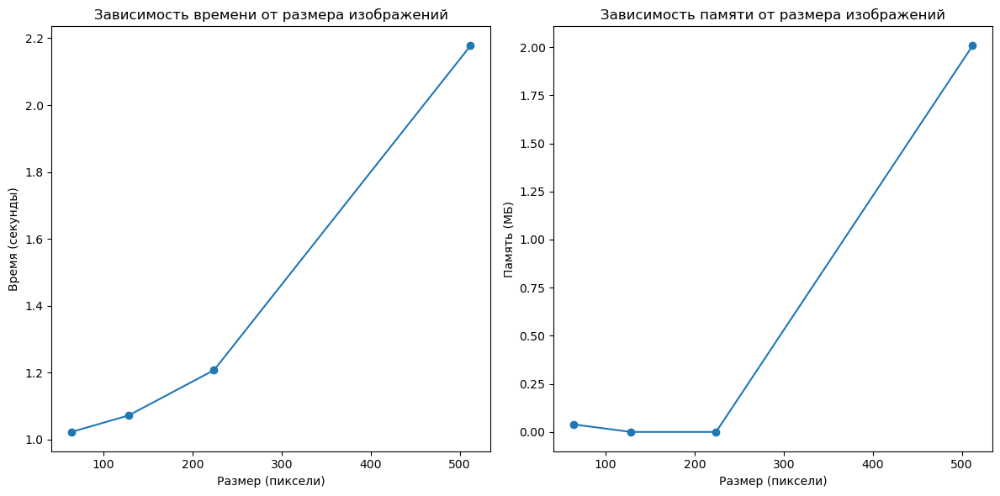

In [26]:
import os
import time
import psutil
import random
from PIL import Image, ImageEnhance, ImageFilter
import matplotlib.pyplot as plt
from datasets import CustomImageDataset
from torchvision import transforms

# Параметры
root = './data/train'
num_images = 100
sizes = [(64, 64), (128, 128), (224, 224), (512, 512)]

# Подготовка датасета
dataset = CustomImageDataset(root, transform=None, target_size=None)
selected_images = dataset.images[:num_images]

# Кастомные аугментации
class RandomBrightnessContrast:
    def __init__(self, p=0.5, brightness_factor=(0.7, 1.3), contrast_factor=(0.7, 1.3)):
        self.p = p
        self.brightness_factor = brightness_factor
        self.contrast_factor = contrast_factor

    def __call__(self, img):
        if random.random() > self.p:
            return img
        brightness = random.uniform(*self.brightness_factor)
        contrast = random.uniform(*self.contrast_factor)
        img = ImageEnhance.Brightness(img).enhance(brightness)
        img = ImageEnhance.Contrast(img).enhance(contrast)
        return img

class RandomGaussianBlur:
    def __init__(self, p=0.5, max_radius=3):
        self.p = p
        self.max_radius = max_radius

    def __call__(self, img):
        if random.random() > self.p:
            return img
        radius = random.uniform(0, self.max_radius)
        return img.filter(ImageFilter.GaussianBlur(radius=radius))

# Настройка пайплайна аугментаций
medium_pipeline = AugmentationPipeline()
medium_pipeline.add_augmentation("HorizontalFlip", transforms.RandomHorizontalFlip(p=0.5), input_type='PIL')
medium_pipeline.add_augmentation("BrightnessContrast", RandomBrightnessContrast(p=0.7, brightness_factor=(0.8, 1.2), contrast_factor=(0.8, 1.2)), input_type='PIL')
medium_pipeline.add_augmentation("GaussianBlur", RandomGaussianBlur(p=0.5, max_radius=2), input_type='PIL')

# Измерение времени и памяти
times = []
memories = []

for size in sizes:
    print(f"\n=== Эксперимент для размера {size} ===")
    start_time = time.time()
    process = psutil.Process(os.getpid())
    memory_start = process.memory_info().rss

    for img_path in selected_images:
        with Image.open(img_path) as img:
            img = img.resize(size, Image.Resampling.LANCZOS)
            aug_img = medium_pipeline.apply(img)

    end_time = time.time()
    memory_end = process.memory_info().rss
    elapsed_time = end_time - start_time
    memory_used = memory_end - memory_start

    times.append(elapsed_time)
    memories.append(memory_used / (1024 * 1024))  # В мегабайтах
    print(f"Время: {elapsed_time:.2f} секунд")
    print(f"Память: {memory_used / (1024 * 1024):.2f} МБ")

# Построение графиков
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot([size[0] for size in sizes], times, marker='o')
plt.title("Зависимость времени от размера изображений")
plt.xlabel("Размер (пиксели)")
plt.ylabel("Время (секунды)")

plt.subplot(1, 2, 2)
plt.plot([size[0] for size in sizes], memories, marker='o')
plt.title("Зависимость памяти от размера изображений")
plt.xlabel("Размер (пиксели)")
plt.ylabel("Память (МБ)")

plt.tight_layout()
plt.show()

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\Игорь Ергин/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth


100%|█████████████████████████████████████████████████████████████████████████████| 44.7M/44.7M [00:18<00:00, 2.47MB/s]


Эпоха 1/5, Loss: 1.1178, Accuracy: 0.5556
Эпоха 2/5, Loss: 0.2316, Accuracy: 0.9111
Эпоха 3/5, Loss: 0.1198, Accuracy: 0.9611
Эпоха 4/5, Loss: 0.1177, Accuracy: 0.9556
Эпоха 5/5, Loss: 0.0867, Accuracy: 0.9722
Точность на валидации: 0.6667


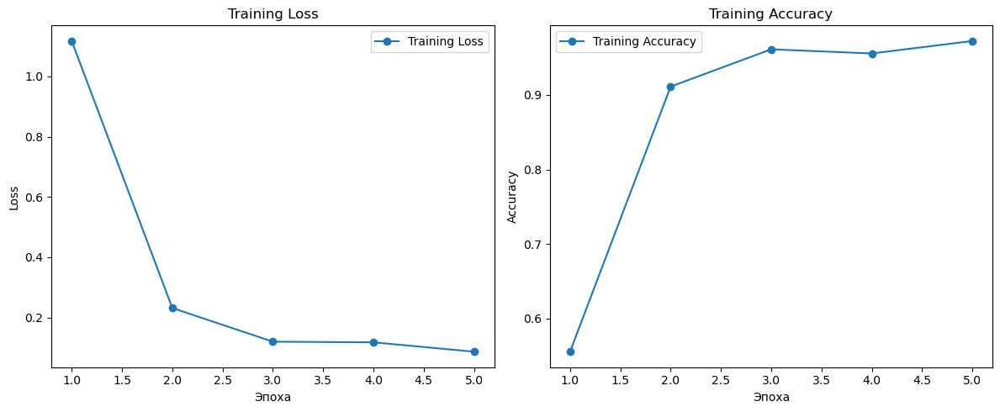

In [30]:
import torch
import torchvision
from torchvision import transforms, models
from torch.utils.data import DataLoader
from datasets import CustomImageDataset
import matplotlib.pyplot as plt
import numpy as np

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Определение преобразований для данных
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Приведение к размеру, ожидаемому ResNet18
    transforms.ToTensor()           # Преобразование в тензор
])

# Загрузка датасетов
train_dataset = CustomImageDataset('./data/train', transform=transform)
val_dataset = CustomImageDataset('./data/test', transform=transform)

# Создание загрузчиков данных
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# Загрузка предобученной модели ResNet18
model = models.resnet18(weights='IMAGENET1K_V1')

# Замена последнего слоя на количество классов в датасете
num_classes = len(train_dataset.get_class_names())
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

# Перенос модели на устройство
model = model.to(device)

# Определение оптимизатора и функции потерь
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

# Списки для хранения метрик
train_losses = []
train_accuracies = []

# Цикл обучения
num_epochs = 5  # Увеличено до 5 для лучшей визуализации
for epoch in range(num_epochs):
    model.train()  # Перевод модели в режим обучения
    running_loss = 0.0
    correct = 0
    total = 0

    for x, y in train_loader:
        x, y = x.to(device), y.to(device)  # Перенос данных на устройство
        optimizer.zero_grad()              # Обнуление градиентов
        out = model(x)                     # Прямой проход
        loss = loss_fn(out, y)             # Вычисление потерь
        loss.backward()                    # Обратное распространение
        optimizer.step()                   # Шаг оптимизации

        # Подсчет метрик
        running_loss += loss.item()
        _, predicted = torch.max(out, 1)
        total += y.size(0)
        correct += (predicted == y).sum().item()

    # Средние значения за эпоху
    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_accuracy)
    print(f'Эпоха {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')

# Валидация
model.eval()  # Перевод модели в режим оценки
val_correct = 0
val_total = 0

with torch.no_grad():  # Отключение вычисления градиентов
    for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        out = model(x)
        _, predicted = torch.max(out, 1)
        val_total += y.size(0)
        val_correct += (predicted == y).sum().item()

val_accuracy = val_correct / val_total
print(f'Точность на валидации: {val_accuracy:.4f}')

# Визуализация
plt.figure(figsize=(12, 5))

# График потерь
plt.subplot(1, 2, 1)
plt.plot(range(1, num_epochs+1), train_losses, marker='o', label='Training Loss')
plt.title('Training Loss')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.legend()

# График точности
plt.subplot(1, 2, 2)
plt.plot(range(1, num_epochs+1), train_accuracies, marker='o', label='Training Accuracy')
plt.title('Training Accuracy')
plt.xlabel('Эпоха')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()